<a href="https://colab.research.google.com/github/emilijadjordjevic/nutriVision/blob/master/exercise.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ucitavanje dataset-a

In [1]:
import random
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

from torchvision.datasets import Food101
from torchvision.transforms import v2, InterpolationMode
from torch.utils.data import Dataset, Subset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from torchvision.models import resnet18, ResNet18_Weights
import os
import zipfile
from google.colab import files


In [2]:
SEED = 29

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


provera da li koristi T4  gpu

In [3]:
print("CUDA:", torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))


CUDA: True
Tesla T4


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


## Model backup


In [5]:
RESTORE_MODELS = False

if RESTORE_MODELS:
    files.upload()
    with zipfile.ZipFile("models.zip") as z:
        z.extractall(".")
    print("models restored")


In [6]:
def saveModels():
    modelFiles = sorted(name for name in os.listdir(".") if name.startswith("model") and name.endswith(".pth"))

    with zipfile.ZipFile("models.zip", "w") as z:
        for name in modelFiles:
            z.write(name)

    print("saved:", *modelFiles, sep="\n")
    files.download("models.zip")


In [7]:
trainUnparsed = Food101(root="./data", split="train", download=True)
testUnparsed = Food101(root="./data", split="test", download=True)


100%|██████████| 5.00G/5.00G [03:52<00:00, 21.5MB/s]


In [8]:
selectedClasses = [
    "pizza",
    "spaghetti_bolognese",
    "spaghetti_carbonara",
    "lasagna",
    "ravioli",

    "steak",
    "hamburger",
    "baby_back_ribs",
    "chicken_wings",
    "grilled_salmon",

    "sushi",
    "sashimi",
    "ramen",
    "fried_rice",
    "dumplings",

    "pancakes",
    "waffles",
    "french_toast",
    "omelette",
    "eggs_benedict",

    "cheesecake",
    "chocolate_cake",
    "ice_cream",
    "donuts",
    "tiramisu",

    "caesar_salad",
    "french_fries",
    "onion_rings",
    "tacos",
    "hot_dog",
]


In [9]:
selectedClassesIds = [trainUnparsed.class_to_idx[name] for name in selectedClasses]


In [10]:
trainIndices = np.where(np.isin(trainUnparsed._labels, selectedClassesIds))[0]
testIndices = np.where(np.isin(testUnparsed._labels, selectedClassesIds))[0]

trainLabels = np.array(trainUnparsed._labels)[trainIndices]

trainIndices, valIndices = train_test_split(
    trainIndices,
    test_size=0.2,
    random_state=SEED,
    stratify=trainLabels
)


In [11]:
trainData = Subset(trainUnparsed, trainIndices)
valData = Subset(trainUnparsed, valIndices)
testData = Subset(testUnparsed, testIndices)

print(f"Classes: {len(selectedClasses)}")
print(f"Train: {len(trainData)} | Val: {len(valData)} | Test: {len(testData)}")
print(f"Total: {len(trainData) + len(valData) + len(testData)}")


Classes: 30
Train: 18000 | Val: 4500 | Test: 7500
Total: 30000


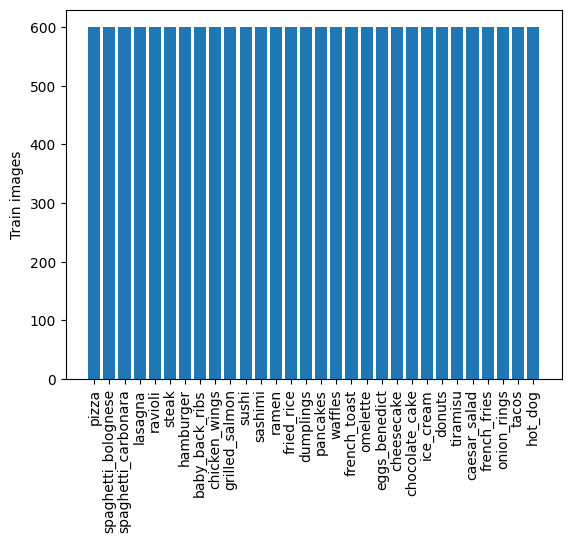

In [12]:
trainClassCounts = []

for classId in selectedClassesIds:
    count = sum(trainUnparsed._labels[i] == classId for i in trainIndices)
    trainClassCounts.append(count)

plt.bar(range(len(selectedClasses)), trainClassCounts)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.ylabel("Train images")
plt.show()


In [13]:
name = "pizza"
classId = trainUnparsed.class_to_idx[name]

trainCount = sum(trainUnparsed._labels[i] == classId for i in trainIndices)
valCount = sum(trainUnparsed._labels[i] == classId for i in valIndices)
testCount = sum(testUnparsed._labels[i] == classId for i in testIndices)

print(name, "train:", trainCount, "val:", valCount, "test:", testCount)


pizza train: 600 val: 150 test: 250


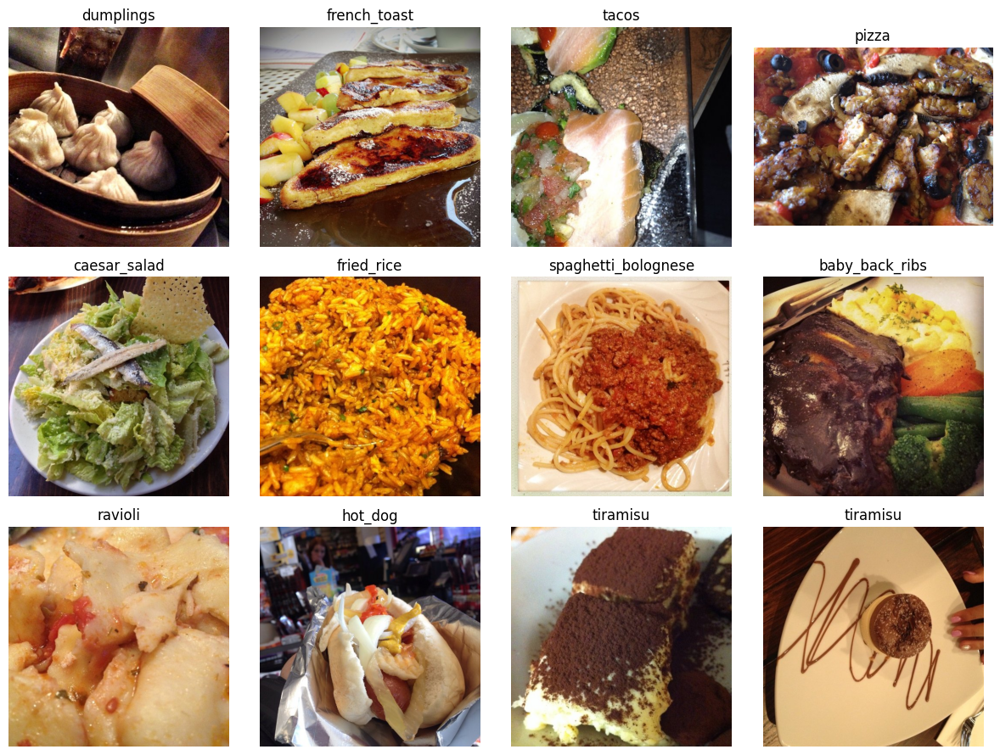

In [14]:
fig, axes = plt.subplots(3, 4, figsize=(12, 9))

for ax in axes.flat:
    i = random.randrange(len(trainData))

    image, label = trainData[i]

    ax.imshow(image)
    ax.set_title(trainUnparsed.classes[label])
    ax.axis("off")

plt.tight_layout()
plt.show()


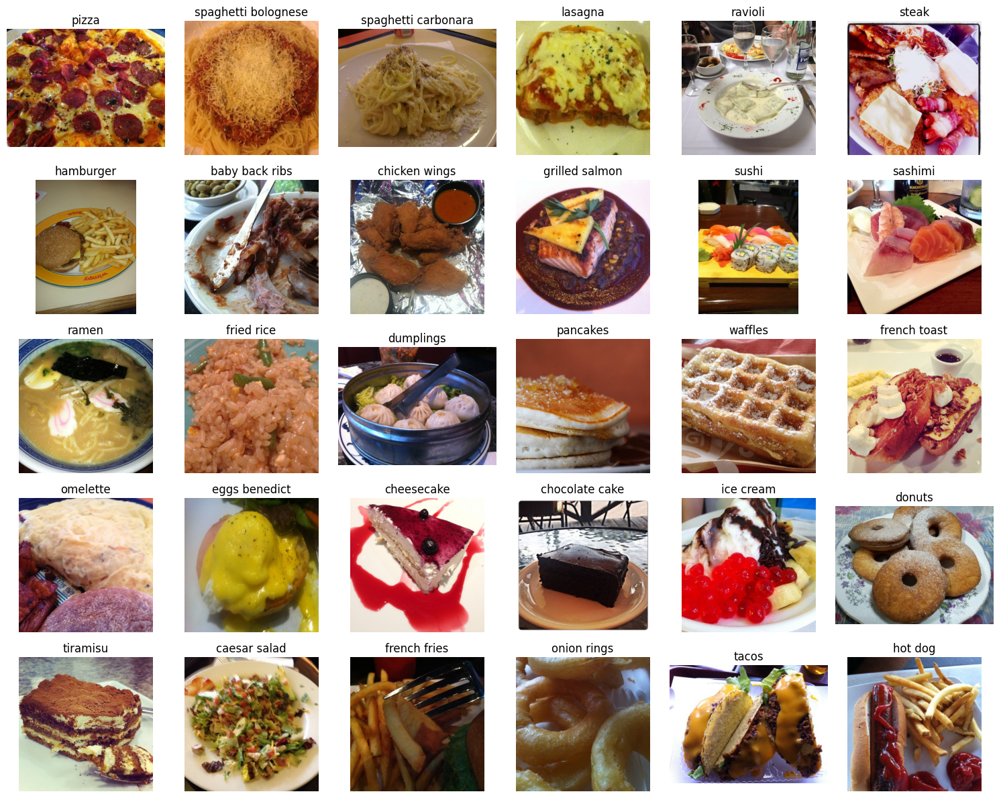

In [15]:
fig, axes = plt.subplots(5, 6, figsize=(15, 12))

for ax, name in zip(axes.flat, selectedClasses):
    classId = trainUnparsed.class_to_idx[name]

    i = next(i for i in trainIndices if trainUnparsed._labels[i] == classId)

    image, label = trainUnparsed[i]

    ax.imshow(image)
    ax.set_title(name.replace("_", " "))
    ax.axis("off")

plt.tight_layout()
plt.show()


neke slike su tamne poput: steak, grilled salmon, fried rice, omlette -> blaga augmentacija svetlosti mozda?

vidimo da velicina hrane dosta varira; tipa: fried rice zauzme celu sliku, dok grilled salmon i hotdog ne

takodje, vidimo da aspect ratio nije isti; nesto je vertikalno, nesto iskoseno

takodje, vidimo slcne klase poput sushi i sashimi, waffles i panckahes i french toast, cheesecake i chocolate cake, ...

vidimo da pozadina moze biti problem za neke slike poput hotdog slike, donuts slike


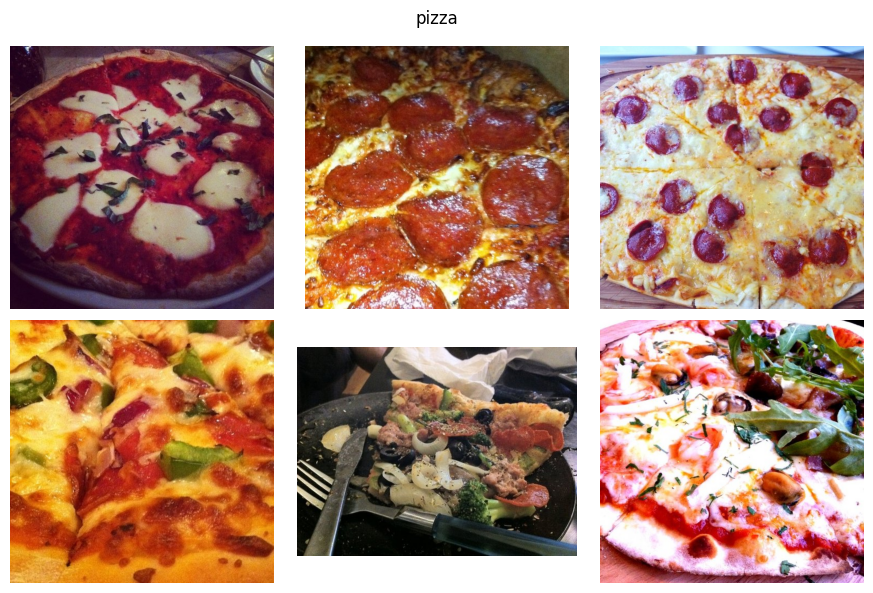

In [16]:
name = "pizza"
classId = trainUnparsed.class_to_idx[name]

indices = [i for i in trainIndices if trainUnparsed._labels[i] == classId]

fig, axes = plt.subplots(2, 3, figsize=(9, 6))

for ax, i in zip(axes.flat, random.sample(indices, 6)):
    image, _ = trainUnparsed[i]

    ax.imshow(image)
    ax.axis("off")

plt.suptitle(name)
plt.tight_layout()
plt.show()


na sonovu samo jedne klase unutar dataeta, vidimo razlicite oblike/prikaze - cela pizza, engde trouglasto, negde pravougaono...

raplciici topinzi - pecurke, bosiljak, paradajz ,...

razlicita udaljenost kamere pri slikaznju podatka; kao i razlicit ugao

neke imaju svetly nke imau tamnu poziciju



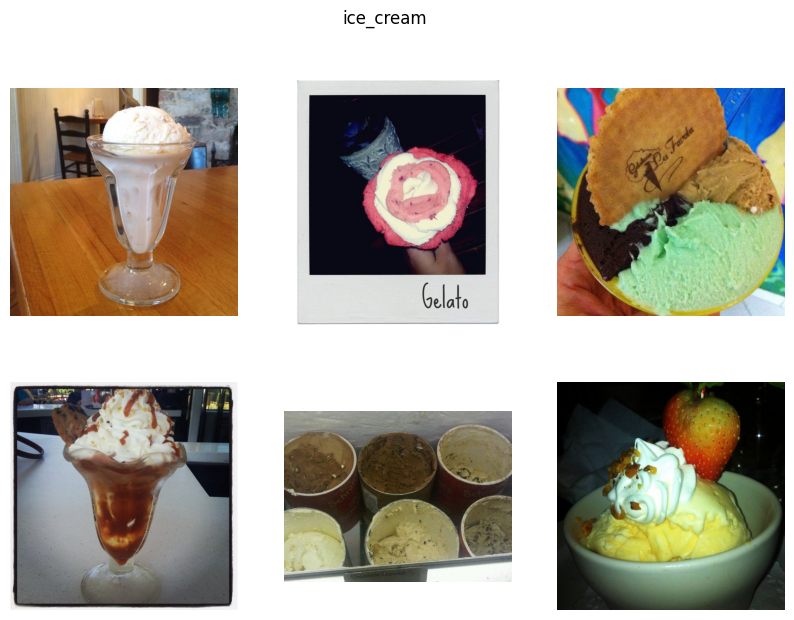

In [17]:
name = "ice_cream"
classId = trainUnparsed.class_to_idx[name]

indices = [i for i in trainIndices if trainUnparsed._labels[i] == classId]
indices = random.sample(indices, 6)

fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for ax, i in zip(axes.flat, indices):
    image, _ = trainUnparsed[i]
    ax.imshow(image)
    ax.axis("off")

plt.suptitle(name)
plt.show()


videli smo da je gore prikazan sladoled u poslasticarnici, negde u kornetu, negde na tanjiru, negde u casici,..

mozemo zakljuciti da npr sladoled moze naci u raznim oblicima, razlicit broj komada,..

takodje, moze imati bilo koju boju

cak ne mora ni da bude sluzen kao kugla, vidimo ovaj u casici nije u obliku sfere

takodje, negde ima biskvit na sebi, negde kornet, negde samo salvetu,..

takodje, jedan od problema sa kojim cemo se suocii je da su neke styvari slicne, poput sushi i sashimi; bolognese i carbonara(ralzikuju se u boji), mozda wafles i french toast(mogu imati slicne topinge pa model nauci samo to)

Problemi na koje treba obratiti paznju:
-velike razlike unutar iste klase
-slicnost izmedju klasa
-razliciti uglovi
-velicina hrane na slici
-razlicita osvetljenja
-razlicire pozadine
-velicina hrane u odnosu na sredinu pored nje

Sada, nisam sigurna posto su slike u formatu 512x512, ne xnam da li da ih resize, na npr 224?

Imamo nekoliko opcija, RandomResizedCrop, TandomHorizontalFlip, RandomRotation, ColorJitter,..



In [18]:
baseTransform = v2.Compose([v2.Resize(256, antialias=True), v2.CenterCrop(224)])

horizontalFlip = v2.RandomHorizontalFlip(p=1.0)

rotation = v2.RandomRotation(degrees=10, interpolation=InterpolationMode.BILINEAR)

colorJitter = v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.10)


In [19]:
randClasses = [
    "ice_cream",
    "hot_dog",
    "grilled_salmon",
    "fried_rice",
    "sushi",
    "pizza"
]


In [20]:
def getRandomClassImage(className):
    classId = trainUnparsed.class_to_idx[className]
    indices = [i for i in trainIndices if trainUnparsed._labels[i] == classId]
    image, _ = trainUnparsed[random.choice(indices)]
    return image


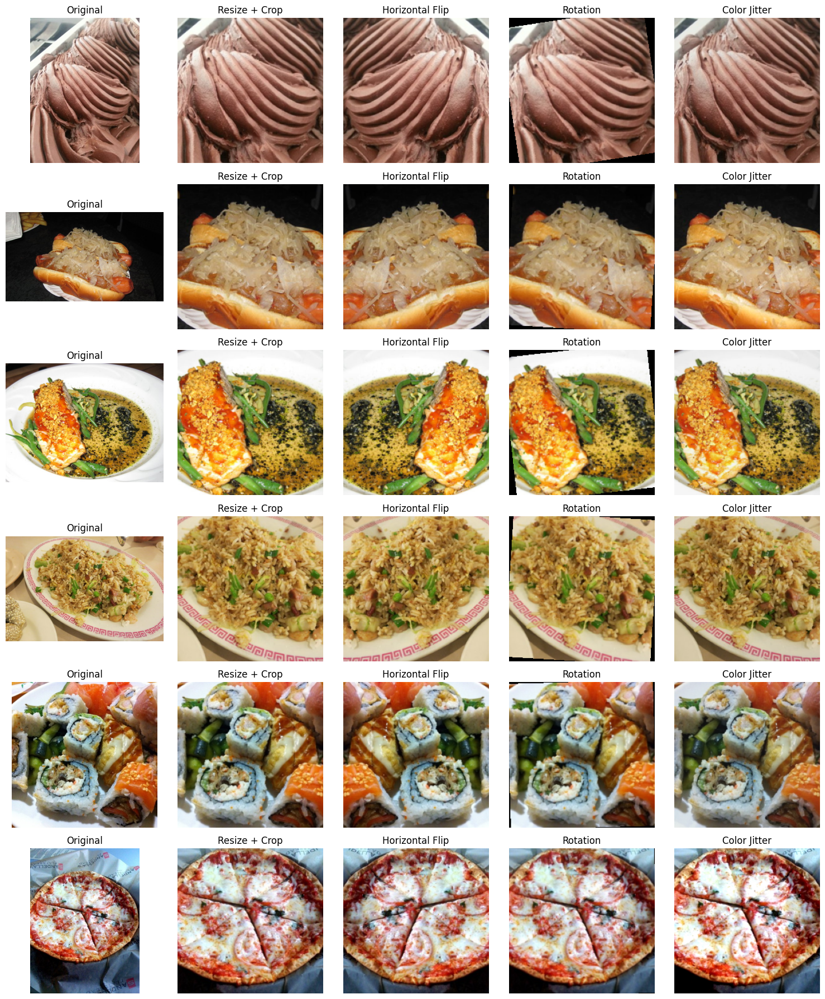

In [21]:
fig, axes = plt.subplots(len(randClasses), 5, figsize=(15, 18))

for row, className in enumerate(randClasses):
    image = getRandomClassImage(className)
    processed = baseTransform(image)

    images = [
        image,
        processed,
        horizontalFlip(processed),
        rotation(processed),
        colorJitter(processed)
    ]

    titles = ["Original", "Resize + Crop", "Horizontal Flip", "Rotation", "Color Jitter"]

    for col in range(5):
        axes[row, col].imshow(images[col])
        axes[row, col].set_title(titles[col])
        axes[row, col].axis("off")

    axes[row, 0].set_ylabel(className)

plt.tight_layout()
plt.show()


ZA resize+crop - izgled aokej, nismo izgubili glavni obj nigde, ali nisam bas sigurna da li je dobro koristiti jer je jer je grana negde mala i nije u centru

horizontalFlip - cuva znacenje slike, okej je, ne moze se ovkao procemiti gledanjem, morace da se vidi na validation

rotation - nisam sigurna bas? pizzu je izbacio iz glavnog kadra, cak stavise, i ovaj sos sto je u crnom nekoj ciniji mi je vise u planu nego pizza

colorjitter - okej, prirodno izgleda, mala je rpoemna svakako

sada, da probamo jos RandomResizeCrop jer hrana ima razlicinu velicinu i polozaj u kadru slike

In [22]:
randomCrop = v2.RandomResizedCrop(size=224, scale=(0.85, 1.0), ratio=(0.9, 1.1), antialias=True)


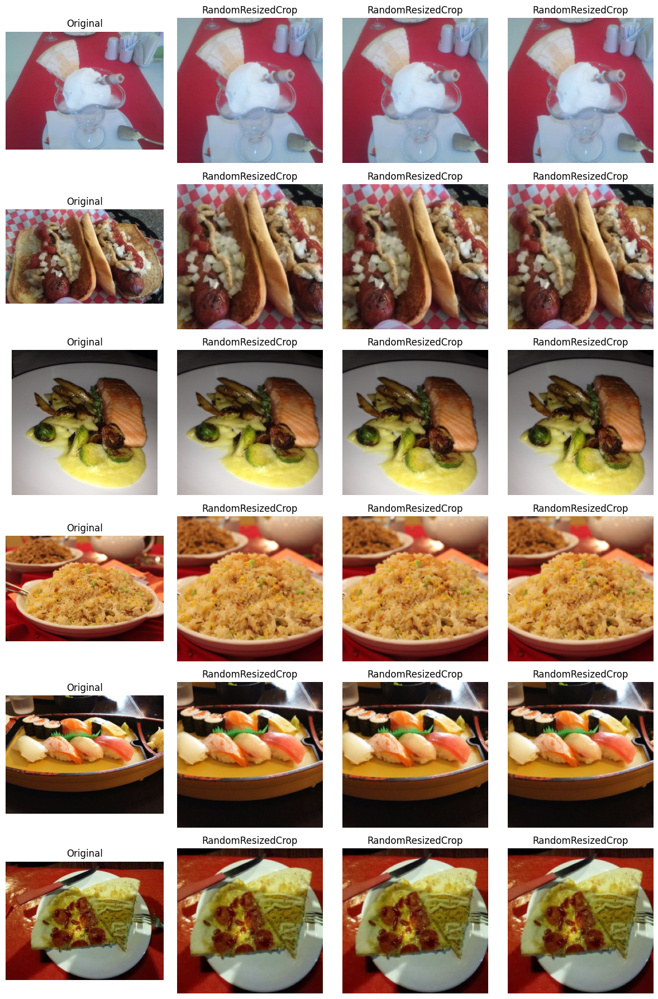

In [23]:
fig, axes = plt.subplots(len(randClasses), 4, figsize=(12, 18))

for row, className in enumerate(randClasses):
    image = getRandomClassImage(className)

    axes[row, 0].imshow(image)
    axes[row, 0].set_title("Original")
    axes[row, 0].axis("off")

    for col in range(1, 4):
        axes[row, col].imshow(randomCrop(image))
        axes[row, col].set_title("RandomResizedCrop")
        axes[row, col].axis("off")

plt.tight_layout()
plt.show()


Deluju nam kao da su skoro iste iz ralzoga sto je crop vrlo blag, stp vidimo iz parametara koji su poslati za scale i ratio. Probala bih malo agresivnije, da viidm kakav cu rezultat dobiti, ali se plasim da cropujem neku granu

In [24]:
testRandomCrop = v2.RandomResizedCrop(size=224, scale=(0.5, 1.0), ratio=(0.75, 1.33), antialias=True)


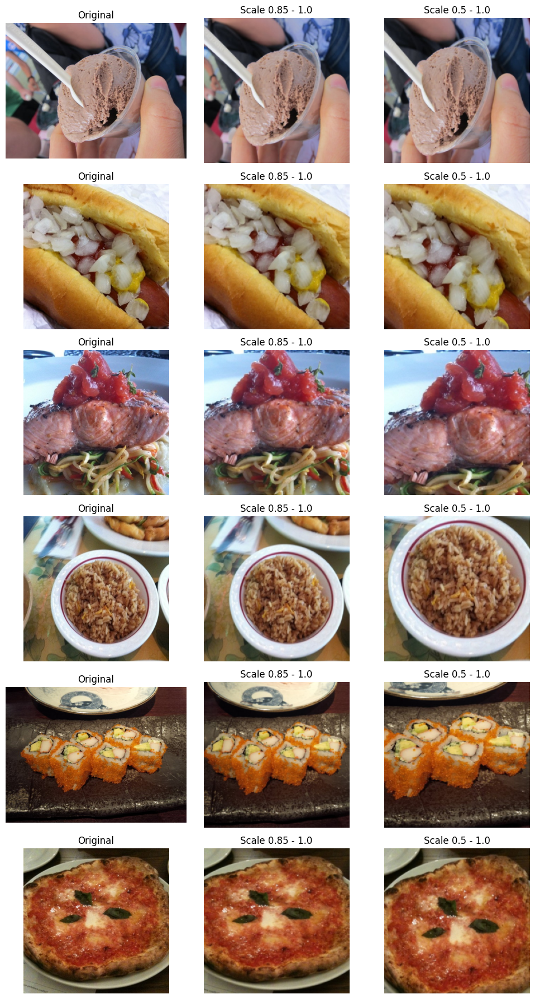

In [25]:
fig, axes = plt.subplots(len(randClasses), 3, figsize=(10, 18))

for row, className in enumerate(randClasses):
    image = getRandomClassImage(className)

    axes[row, 0].imshow(image)
    axes[row, 0].set_title("Original")

    axes[row, 1].imshow(randomCrop(image))
    axes[row, 1].set_title("Scale 0.85 - 1.0")

    axes[row, 2].imshow(testRandomCrop(image))
    axes[row, 2].set_title("Scale 0.5 - 1.0")

    for col in range(3):
        axes[row, col].axis("off")

plt.tight_layout()
plt.show()


za crop sa scale=(0.85, 1.0), slike su skoro iste kao oriiginal

kod scale=(0.5, 1.0) vifljivo je i za sladoled, i za fried rice, sushi i pizzu, klasa ostaje prepoznatljiva.

ne bih uzlea ipak ovkao drasticno, jer su bili primeri gde bih mogla da isecem dota, tipa za fried rice ako se secam, pa cu uzeti neku sredinul npr 0.7

In [26]:
randomCrop = v2.RandomResizedCrop(
    size=224,
    scale=(0.70, 1.0),
    ratio=(0.90, 1.10),
    antialias=True
)

horizontalFlip = v2.RandomHorizontalFlip(p=0.5)

colorJitter = v2.RandomApply([
    v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.10)
], p=0.5)


In [27]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

trainTransform = v2.Compose([
    randomCrop,
    horizontalFlip,
    colorJitter,
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std)
])

evalTransform = v2.Compose([
    v2.Resize(256, antialias=True),
    v2.CenterCrop(224),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std)
])


In [28]:
classMapping = {
    trainUnparsed.class_to_idx[name]: i
    for i, name in enumerate(selectedClasses)
}


In [29]:
class FoodSubset(Dataset):
    def __init__(self, subset, transform, classMapping):
        self.subset = subset
        self.transform = transform
        self.classMapping = classMapping

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, i):
        image, label = self.subset[i]
        image = self.transform(image)
        label = self.classMapping[label]
        return image, label


In [30]:
trainData = FoodSubset(trainData, trainTransform, classMapping)
valData = FoodSubset(valData, evalTransform, classMapping)
testData = FoodSubset(testData, evalTransform, classMapping)

batchSize = 64

trainLoader = DataLoader(trainData, batch_size=batchSize, shuffle=True, num_workers=2, pin_memory=True)
valLoader = DataLoader(valData, batch_size=batchSize, shuffle=False, num_workers=2, pin_memory=True)
testLoader = DataLoader(testData, batch_size=batchSize, shuffle=False, num_workers=2, pin_memory=True)

images, labels = next(iter(trainLoader))
print(images.shape, labels.shape)


torch.Size([64, 3, 224, 224]) torch.Size([64])


## Model A1 - baseline

In [31]:
class FoodCNN(nn.Module):
    def __init__(self, numClasses):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(256, numClasses)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


## Model A2 - improved CNN

In [32]:
class FoodCNN2(nn.Module):
    def __init__(self, numClasses):
        super().__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(256, numClasses)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.pool(x)
        x = self.classifier(x)
        return x


## Training

In [33]:
def evaluate(model, loader, criterion):
    model.eval()
    totalLoss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            totalLoss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

    return totalLoss / total, correct / total


In [34]:
def trainModel(model, name, maxEpochs=30, lr=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", factor=0.5, patience=2
    )

    history = {
        "trainLoss": [], "trainAcc": [],
        "valLoss": [], "valAcc": [], "lr": []
    }

    bestValLoss = float("inf")
    badEpochs = 0

    for epoch in range(maxEpochs):
        model.train()
        totalLoss = 0
        correct = 0
        total = 0

        for images, labels in trainLoader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            totalLoss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

        trainLoss = totalLoss / total
        trainAcc = correct / total
        valLoss, valAcc = evaluate(model, valLoader, criterion)

        scheduler.step(valLoss)
        currentLR = optimizer.param_groups[0]["lr"]

        history["trainLoss"].append(trainLoss)
        history["trainAcc"].append(trainAcc)
        history["valLoss"].append(valLoss)
        history["valAcc"].append(valAcc)
        history["lr"].append(currentLR)

        improved = valLoss < bestValLoss

        if improved:
            bestValLoss = valLoss
            badEpochs = 0
        else:
            badEpochs += 1

        checkpoint = {
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler_state_dict": scheduler.state_dict(),
            "epoch": epoch + 1,
            "best_val_loss": bestValLoss,
            "history": history,
            "classes": selectedClasses
        }

        torch.save(checkpoint, name + "_last.pth")

        if improved:
            torch.save(checkpoint, name + "_best.pth")

        print(
            f"epoch {epoch + 1:02d} | "
            f"train {trainLoss:.4f} {trainAcc:.3f} | "
            f"val {valLoss:.4f} {valAcc:.3f} | "
            f"lr {currentLR:.1e}"
        )

        if badEpochs >= 5:
            print("early stopping")
            break

    return history


### Train A1

In [35]:
modelA1 = FoodCNN(len(selectedClasses)).to(device)

if os.path.exists("modelA1_last.pth"):
    historyA1 = torch.load("modelA1_last.pth", map_location="cpu", weights_only=False)["history"]
    print("A1 loaded")
else:
    historyA1 = trainModel(modelA1, "modelA1")


epoch 01 | train 3.2722 0.077 | val 3.1353 0.116 | lr 1.0e-03
epoch 02 | train 3.1037 0.127 | val 3.0443 0.152 | lr 1.0e-03
epoch 03 | train 2.9984 0.156 | val 2.8852 0.188 | lr 1.0e-03
epoch 04 | train 2.8635 0.193 | val 2.7727 0.221 | lr 1.0e-03
epoch 05 | train 2.7491 0.227 | val 2.6536 0.256 | lr 1.0e-03
epoch 06 | train 2.6305 0.247 | val 2.5357 0.269 | lr 1.0e-03
epoch 07 | train 2.5477 0.272 | val 2.4512 0.300 | lr 1.0e-03
epoch 08 | train 2.4707 0.292 | val 2.4550 0.297 | lr 1.0e-03
epoch 09 | train 2.3893 0.315 | val 2.3743 0.319 | lr 1.0e-03
epoch 10 | train 2.3310 0.330 | val 2.3433 0.334 | lr 1.0e-03
epoch 11 | train 2.2872 0.344 | val 2.2157 0.361 | lr 1.0e-03
epoch 12 | train 2.2297 0.357 | val 2.1753 0.375 | lr 1.0e-03
epoch 13 | train 2.1841 0.372 | val 2.1128 0.401 | lr 1.0e-03
epoch 14 | train 2.1308 0.385 | val 2.0659 0.401 | lr 1.0e-03
epoch 15 | train 2.0980 0.399 | val 2.0278 0.417 | lr 1.0e-03
epoch 16 | train 2.0619 0.407 | val 2.0121 0.425 | lr 1.0e-03
epoch 17

### Train A2

In [36]:
modelA2 = FoodCNN2(len(selectedClasses)).to(device)

if os.path.exists("modelA2_last.pth"):
    historyA2 = torch.load("modelA2_last.pth", map_location="cpu", weights_only=False)["history"]
    print("A2 loaded")
else:
    historyA2 = trainModel(modelA2, "modelA2")


epoch 01 | train 3.0215 0.148 | val 2.9288 0.172 | lr 1.0e-03
epoch 02 | train 2.7514 0.217 | val 2.5870 0.262 | lr 1.0e-03
epoch 03 | train 2.5311 0.272 | val 2.9446 0.230 | lr 1.0e-03
epoch 04 | train 2.3522 0.322 | val 2.6172 0.266 | lr 1.0e-03
epoch 05 | train 2.2173 0.359 | val 2.3608 0.312 | lr 1.0e-03
epoch 06 | train 2.0901 0.391 | val 2.2507 0.350 | lr 1.0e-03
epoch 07 | train 1.9971 0.420 | val 2.1430 0.374 | lr 1.0e-03
epoch 08 | train 1.8972 0.448 | val 1.9709 0.430 | lr 1.0e-03
epoch 09 | train 1.8110 0.474 | val 2.0914 0.401 | lr 1.0e-03
epoch 10 | train 1.7278 0.499 | val 2.2364 0.363 | lr 1.0e-03
epoch 11 | train 1.6668 0.517 | val 2.0734 0.416 | lr 5.0e-04
epoch 12 | train 1.4993 0.567 | val 1.5768 0.542 | lr 5.0e-04
epoch 13 | train 1.4490 0.578 | val 1.5291 0.569 | lr 5.0e-04
epoch 14 | train 1.4226 0.584 | val 1.5219 0.564 | lr 5.0e-04
epoch 15 | train 1.3770 0.597 | val 1.5536 0.554 | lr 5.0e-04
epoch 16 | train 1.3499 0.606 | val 1.4890 0.566 | lr 5.0e-04
epoch 17

## Results

In [37]:
checkpointA1 = torch.load("modelA1_best.pth", map_location=device, weights_only=False)
checkpointA2 = torch.load("modelA2_best.pth", map_location=device, weights_only=False)

modelA1 = FoodCNN(len(selectedClasses)).to(device)
modelA2 = FoodCNN2(len(selectedClasses)).to(device)

modelA1.load_state_dict(checkpointA1["model_state_dict"])
modelA2.load_state_dict(checkpointA2["model_state_dict"])

historyA1 = torch.load("modelA1_last.pth", map_location="cpu", weights_only=False)["history"]
historyA2 = torch.load("modelA2_last.pth", map_location="cpu", weights_only=False)["history"]

print("A1 best epoch:", checkpointA1["epoch"], "| val loss:", round(checkpointA1["best_val_loss"], 4))
print("A2 best epoch:", checkpointA2["epoch"], "| val loss:", round(checkpointA2["best_val_loss"], 4))


A1 best epoch: 30 | val loss: 1.6948
A2 best epoch: 27 | val loss: 1.1438


In [38]:
paramsA1 = sum(p.numel() for p in modelA1.parameters())
paramsA2 = sum(p.numel() for p in modelA2.parameters())

print("A1 params:", paramsA1)
print("A2 params:", paramsA2)


A1 params: 396126
A2 params: 1135518


In [39]:
def plotHistory(history, name):
    plt.plot(history["trainLoss"], label="train")
    plt.plot(history["valLoss"], label="validation")
    plt.title(name + " loss")
    plt.xlabel("Epoch")
    plt.legend()
    plt.show()

    plt.plot(history["trainAcc"], label="train")
    plt.plot(history["valAcc"], label="validation")
    plt.title(name + " accuracy")
    plt.xlabel("Epoch")
    plt.legend()
    plt.show()


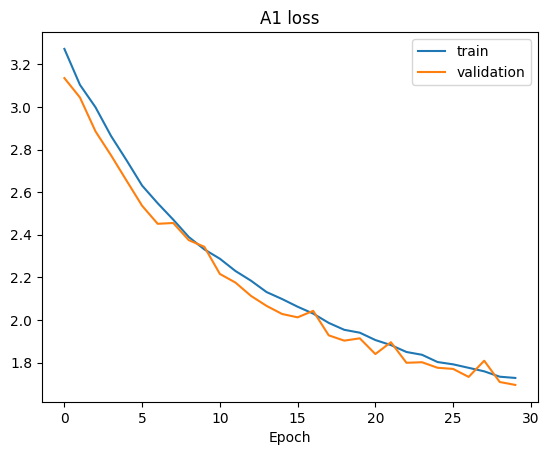

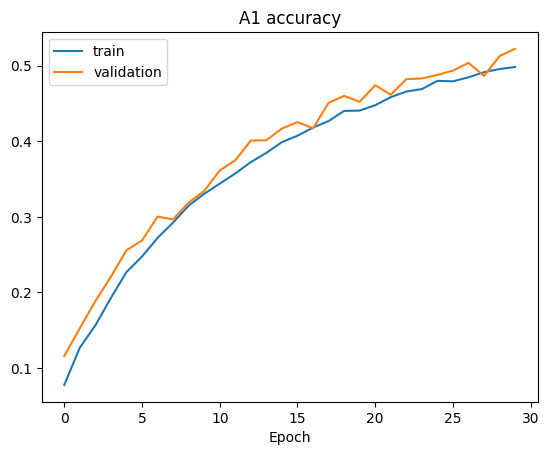

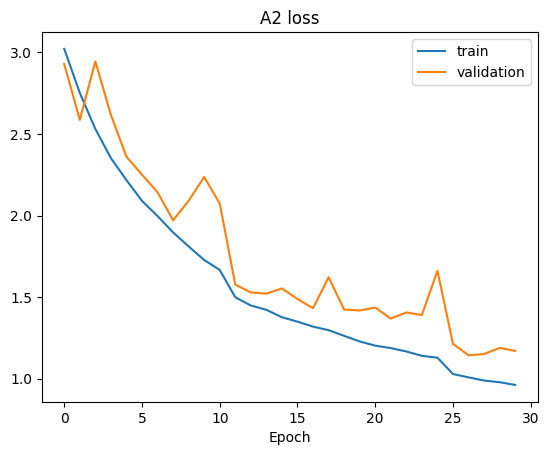

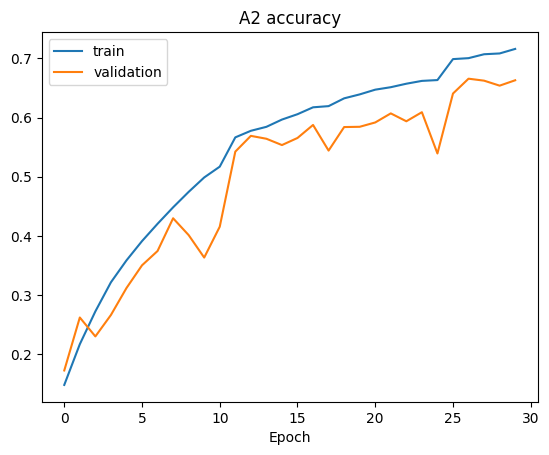

In [40]:
plotHistory(historyA1, "A1")
plotHistory(historyA2, "A2")


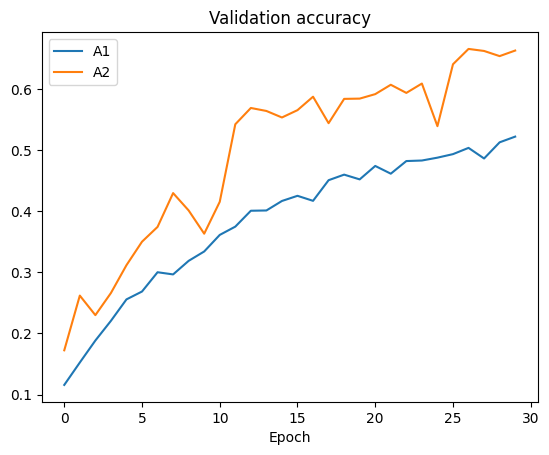

In [41]:
plt.plot(historyA1["valAcc"], label="A1")
plt.plot(historyA2["valAcc"], label="A2")
plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()


In [42]:
def getPredictions(model, loader):
    trueLabels = []
    predictions = []

    model.eval()

    with torch.no_grad():
        for images, labels in loader:
            outputs = model(images.to(device))
            predictions.extend(outputs.argmax(1).cpu().tolist())
            trueLabels.extend(labels.tolist())

    return trueLabels, predictions


In [43]:
trueA1, predA1 = getPredictions(modelA1, valLoader)
trueA2, predA2 = getPredictions(modelA2, valLoader)

print(f"A1 | accuracy {accuracy_score(trueA1, predA1):.3f} | macro F1 {f1_score(trueA1, predA1, average='macro'):.3f}")
print(f"A2 | accuracy {accuracy_score(trueA2, predA2):.3f} | macro F1 {f1_score(trueA2, predA2, average='macro'):.3f}")


A1 | accuracy 0.522 | macro F1 0.520
A2 | accuracy 0.666 | macro F1 0.668


In [44]:
print(classification_report(trueA2, predA2, target_names=selectedClasses, digits=3))


                     precision    recall  f1-score   support

              pizza      0.569     0.827     0.674       150
spaghetti_bolognese      0.771     0.807     0.788       150
spaghetti_carbonara      0.896     0.687     0.777       150
            lasagna      0.576     0.553     0.565       150
            ravioli      0.680     0.553     0.610       150
              steak      0.514     0.487     0.500       150
          hamburger      0.631     0.593     0.612       150
     baby_back_ribs      0.601     0.713     0.652       150
      chicken_wings      0.752     0.667     0.707       150
     grilled_salmon      0.682     0.487     0.568       150
              sushi      0.718     0.680     0.699       150
            sashimi      0.880     0.733     0.800       150
              ramen      0.867     0.653     0.745       150
         fried_rice      0.850     0.753     0.799       150
          dumplings      0.797     0.733     0.764       150
           pancakes    

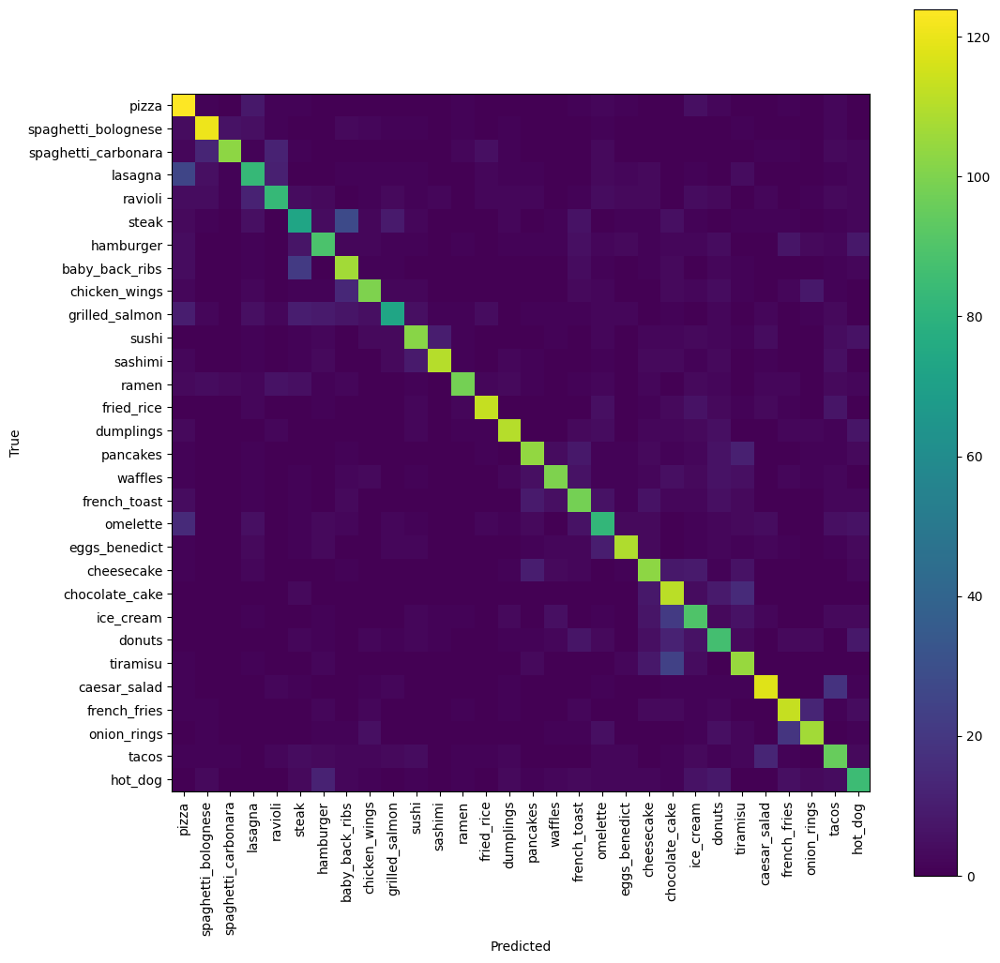

In [45]:
cm = confusion_matrix(trueA2, predA2)

plt.figure(figsize=(12, 12))
plt.imshow(cm)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.yticks(range(len(selectedClasses)), selectedClasses)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.show()


In [46]:
mistakes = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass != predictedClass:
            mistakes.append((
                cm[trueClass, predictedClass],
                selectedClasses[trueClass],
                selectedClasses[predictedClass]
            ))

mistakes.sort(reverse=True)

for count, trueClass, predictedClass in mistakes[:10]:
    print(f"{trueClass} -> {predictedClass}: {count}")

steak -> baby_back_ribs: 28
lasagna -> pizza: 26
tiramisu -> chocolate_cake: 24
ice_cream -> chocolate_cake: 21
baby_back_ribs -> steak: 21
onion_rings -> french_fries: 19
caesar_salad -> tacos: 18
omelette -> pizza: 15
chocolate_cake -> tiramisu: 15
chicken_wings -> baby_back_ribs: 14


## Model B - transfer learning

Sledece: B1 feature extraction, B2 partial fine-tuning.

In [47]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

In [48]:
weights = ResNet18_Weights.DEFAULT
modelB1 = resnet18(weights=weights)

for p in modelB1.parameters():
    p.requires_grad = False

modelB1.fc = nn.Linear(modelB1.fc.in_features, len(selectedClasses))
modelB1 = modelB1.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 132MB/s]


In [49]:
for name, p in modelB1.named_parameters():
    if p.requires_grad:
        print(name)

fc.weight
fc.bias


In [50]:
if os.path.exists("modelB1_last.pth"):
    historyB1 = torch.load("modelB1_last.pth", map_location="cpu", weights_only=False)["history"]
    print("B1 loaded")
else:
    historyB1 = trainModel(modelB1, "modelB1", maxEpochs=20, lr=0.001)


epoch 01 | train 2.0746 0.468 | val 1.4877 0.612 | lr 1.0e-03
epoch 02 | train 1.3678 0.625 | val 1.3280 0.636 | lr 1.0e-03
epoch 03 | train 1.2231 0.656 | val 1.2545 0.642 | lr 1.0e-03
epoch 04 | train 1.1620 0.667 | val 1.2461 0.652 | lr 1.0e-03
epoch 05 | train 1.1208 0.675 | val 1.2192 0.652 | lr 1.0e-03
epoch 06 | train 1.0881 0.681 | val 1.2223 0.653 | lr 1.0e-03
epoch 07 | train 1.0614 0.690 | val 1.1929 0.656 | lr 1.0e-03
epoch 08 | train 1.0487 0.696 | val 1.2217 0.648 | lr 1.0e-03
epoch 09 | train 1.0238 0.696 | val 1.1970 0.656 | lr 1.0e-03
epoch 10 | train 1.0256 0.700 | val 1.1915 0.660 | lr 1.0e-03
epoch 11 | train 1.0052 0.705 | val 1.1886 0.659 | lr 1.0e-03
epoch 12 | train 0.9980 0.702 | val 1.1804 0.663 | lr 1.0e-03
epoch 13 | train 0.9891 0.709 | val 1.1802 0.670 | lr 1.0e-03
epoch 14 | train 0.9787 0.710 | val 1.1915 0.662 | lr 1.0e-03
epoch 15 | train 0.9732 0.708 | val 1.1799 0.672 | lr 1.0e-03
epoch 16 | train 0.9668 0.712 | val 1.2111 0.659 | lr 1.0e-03
epoch 17

### Save trained models to computer


In [51]:
saveModels()


saved:
modelA1_best.pth
modelA1_last.pth
modelA2_best.pth
modelA2_last.pth
modelB1_best.pth
modelB1_last.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# B1 results

In [52]:
checkpointB1 = torch.load("modelB1_best.pth", map_location=device, weights_only=False)

modelB1 = resnet18(weights=None)

for p in modelB1.parameters():
    p.requires_grad = False

modelB1.fc = nn.Linear(modelB1.fc.in_features, len(selectedClasses))
modelB1.load_state_dict(checkpointB1["model_state_dict"])
modelB1 = modelB1.to(device)
modelB1.eval()

historyB1 = torch.load("modelB1_last.pth", map_location="cpu", weights_only=False)["history"]

print("B1 best epoch:", checkpointB1["epoch"], "| val loss:", round(checkpointB1["best_val_loss"], 4))

B1 best epoch: 20 | val loss: 1.17


In [53]:
trueB1, predB1 = getPredictions(modelB1, valLoader)

print(f"A1 | accuracy {accuracy_score(trueA1, predA1):.3f} | macro F1 {f1_score(trueA1, predA1, average='macro'):.3f}")
print(f"A2 | accuracy {accuracy_score(trueA2, predA2):.3f} | macro F1 {f1_score(trueA2, predA2, average='macro'):.3f}")
print(f"B1 | accuracy {accuracy_score(trueB1, predB1):.3f} | macro F1 {f1_score(trueB1, predB1, average='macro'):.3f}")

A1 | accuracy 0.522 | macro F1 0.520
A2 | accuracy 0.666 | macro F1 0.668
B1 | accuracy 0.672 | macro F1 0.670


In [54]:
paramsB1 = sum(p.numel() for p in modelB1.parameters())
trainableB1 = sum(p.numel() for p in modelB1.parameters() if p.requires_grad)

print("B1 params:", paramsB1)
print("B1 trainable:", trainableB1)

B1 params: 11191902
B1 trainable: 15390


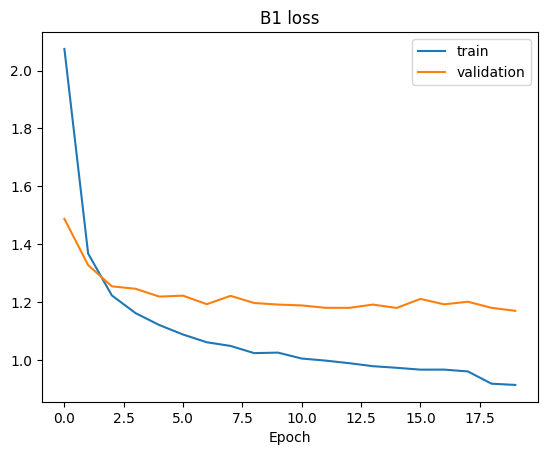

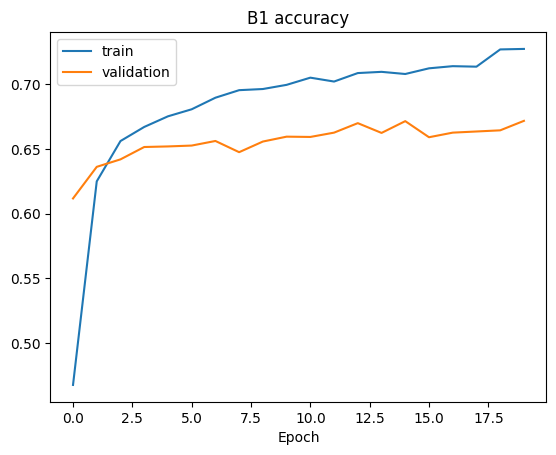

In [55]:
plotHistory(historyB1, "B1")

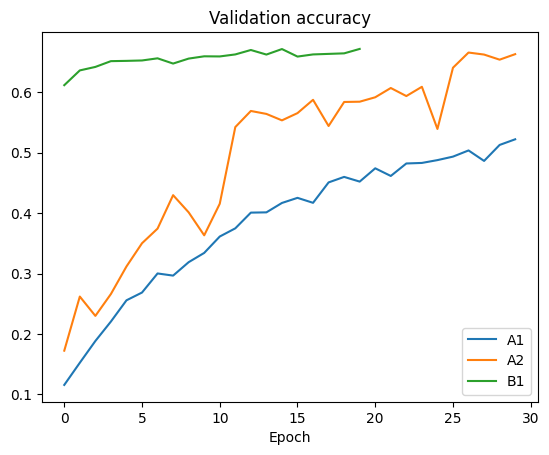

In [56]:
plt.plot(historyA1["valAcc"], label="A1")
plt.plot(historyA2["valAcc"], label="A2")
plt.plot(historyB1["valAcc"], label="B1")
plt.title("Validation accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.show()

In [57]:
print(classification_report(trueB1, predB1, target_names=selectedClasses, digits=3))

                     precision    recall  f1-score   support

              pizza      0.748     0.733     0.741       150
spaghetti_bolognese      0.740     0.720     0.730       150
spaghetti_carbonara      0.674     0.813     0.737       150
            lasagna      0.623     0.607     0.615       150
            ravioli      0.506     0.520     0.513       150
              steak      0.643     0.480     0.550       150
          hamburger      0.711     0.673     0.692       150
     baby_back_ribs      0.651     0.633     0.642       150
      chicken_wings      0.669     0.780     0.720       150
     grilled_salmon      0.483     0.480     0.482       150
              sushi      0.586     0.613     0.599       150
            sashimi      0.778     0.793     0.785       150
              ramen      0.792     0.760     0.776       150
         fried_rice      0.723     0.767     0.744       150
          dumplings      0.901     0.727     0.804       150
           pancakes    

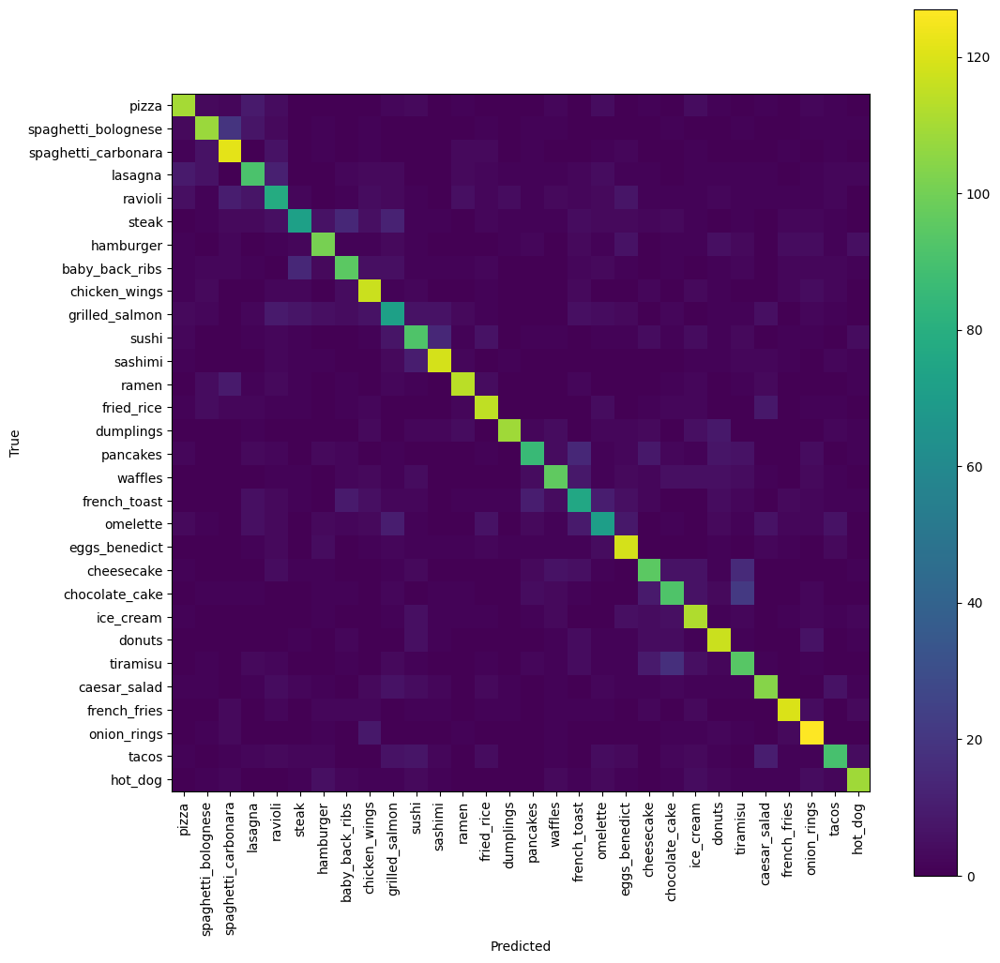

In [58]:
cmB1 = confusion_matrix(trueB1, predB1)

plt.figure(figsize=(12, 12))
plt.imshow(cmB1)
plt.xticks(range(len(selectedClasses)), selectedClasses, rotation=90)
plt.yticks(range(len(selectedClasses)), selectedClasses)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.colorbar()
plt.show()

In [59]:
mistakesB1 = []

for trueClass in range(len(selectedClasses)):
    for predictedClass in range(len(selectedClasses)):
        if trueClass != predictedClass:
            mistakesB1.append((
                cmB1[trueClass, predictedClass],
                selectedClasses[trueClass],
                selectedClasses[predictedClass]
            ))

mistakesB1.sort(reverse=True)

for count, trueClass, predictedClass in mistakesB1[:10]:
    print(f"{trueClass} -> {predictedClass}: {count}")

chocolate_cake -> tiramisu: 21
spaghetti_bolognese -> spaghetti_carbonara: 19
tiramisu -> chocolate_cake: 17
cheesecake -> tiramisu: 15
sushi -> sashimi: 14
steak -> baby_back_ribs: 14
pancakes -> french_toast: 14
baby_back_ribs -> steak: 14
steak -> grilled_salmon: 12
lasagna -> ravioli: 11


### Best and worst classes

In [60]:
def printClassResults(name, trueLabels, predictions):
    report = classification_report(
        trueLabels,
        predictions,
        target_names=selectedClasses,
        output_dict=True,
        zero_division=0
    )

    scores = [(report[className]["f1-score"], className) for className in selectedClasses]
    scores.sort(reverse=True)

    print(name, "best")
    for score, className in scores[:5]:
        print(f"{className}: {score:.3f}")

    print(name, "worst")
    for score, className in scores[-5:][::-1]:
        print(f"{className}: {score:.3f}")

In [61]:
printClassResults("A1", trueA1, predA1)
print()
printClassResults("A2", trueA2, predA2)
print()
printClassResults("B1", trueB1, predB1)

A1 best
sashimi: 0.671
dumplings: 0.657
spaghetti_carbonara: 0.632
onion_rings: 0.625
fried_rice: 0.618
A1 worst
grilled_salmon: 0.334
donuts: 0.344
omelette: 0.369
hot_dog: 0.384
ravioli: 0.389

A2 best
sashimi: 0.800
fried_rice: 0.799
spaghetti_bolognese: 0.788
spaghetti_carbonara: 0.777
caesar_salad: 0.774
A2 worst
steak: 0.500
donuts: 0.544
omelette: 0.550
hot_dog: 0.559
lasagna: 0.565

B1 best
french_fries: 0.811
dumplings: 0.804
sashimi: 0.785
ramen: 0.776
onion_rings: 0.772
B1 worst
grilled_salmon: 0.482
omelette: 0.507
french_toast: 0.512
ravioli: 0.513
steak: 0.550


### B1 mistakes

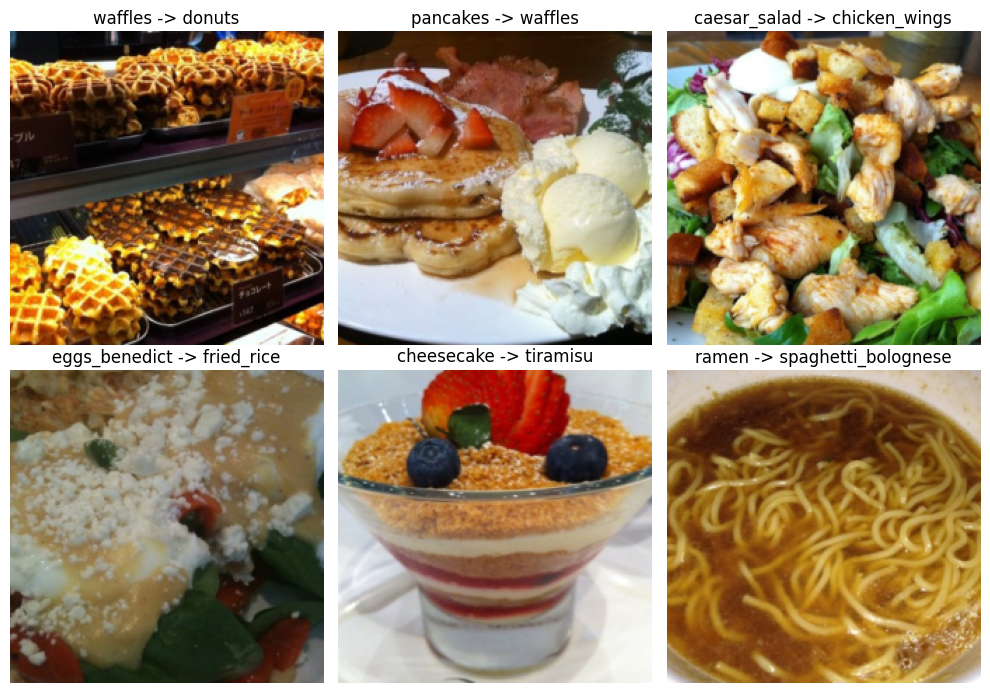

In [62]:
wrong = np.where(np.array(trueB1) != np.array(predB1))[0][:6]

meanTensor = torch.tensor(mean).view(3, 1, 1)
stdTensor = torch.tensor(std).view(3, 1, 1)

fig, axes = plt.subplots(2, 3, figsize=(10, 7))

for ax, i in zip(axes.flat, wrong):
    image, label = valData[i]
    image = image * stdTensor + meanTensor
    image = image.clamp(0, 1)

    ax.imshow(image.permute(1, 2, 0))
    ax.set_title(f"{selectedClasses[label]} -> {selectedClasses[predB1[i]]}")
    ax.axis("off")

plt.tight_layout()
plt.show()